In [2]:
fig_target_dir = "./Figures/Y_maze/B_CPP_plots/"
data_target_dir = "./Data/processed_data/Y_maze/for_b_cpp_calculation/simulated_data/"

In [3]:
import glob
import numpy as np
import pickle
import seaborn as sns
import pylab as pl
import pandas as pd
from pickle_objects import save_object, load_object
import matplotlib.pyplot as plt

plt.rcParams["figure.facecolor"] = "w"


In [4]:
files = glob.glob(data_target_dir+"sim*.pkl")

In [5]:
B_CPP_df = pd.DataFrame(columns=["Volatility","Condition","Conflict","Session","B-0","B-1","CPP","Trial","B_diff","change_point","Block"])

for f in files:
    temp = pd.DataFrame(columns =["Volatility","Condition","Conflict","Session","B-0","B-1","CPP","Trial","B_diff","change_point","Block"])
    
    conf = f.split('/')[-1].split('conflict_')[1].split('_')[0]
    cond = f.split('/')[-1].split('condition_')[1].split('_')[0]
    vol = f.split('/')[-1].split('volatility_')[1].split('_')[0]
    sess = f.split('/')[-1].split('session_')[1].split('.pkl')[0]
    
    sim = load_object(f)
    temp["B-0"] = sim.B[:,0]
    temp["B-1"] = sim.B[:,1]
    temp["CPP"] = sim.CPP
    temp["Volatility"] = vol
    temp["Condition"] = cond
    temp["Conflict"] = conf
    temp["Session"] = sess
    temp["Trial"] = np.arange(len(sim.B))
    temp["B_diff"] = sim.B_diff
    temp["signed_B_diff"] = sim.signed_B_diff
    temp["change_point"] = sim.expParam.cp
    temp["Block"] = sim.expParam.p_id_solution
    temp["learning_rate"] = sim.lr
    temp["RPE-0"] = sim.rpe[:,0]
    temp["RPE-1"] = sim.rpe[:,1]
    temp["MC"] = sim.MC
    temp["sF"] = sim.sF
    temp["ideal_B"] = sim.ideal_B
    
    B_CPP_df = B_CPP_df.append(temp,ignore_index=True)
    

In [6]:
B_CPP_df["Condition + Volatility"] = B_CPP_df["Condition"] +" - "+B_CPP_df["Volatility"]
B_CPP_df["Condition + Block"] = B_CPP_df["Condition"] +" - "+B_CPP_df["Block"] 
B_CPP_df["Condition + Conflict"] = B_CPP_df["Condition"] +" - "+B_CPP_df["Conflict"] 
B_CPP_df["Conflict + Volatility"] = B_CPP_df["Conflict"] +" - "+B_CPP_df["Volatility"] 

B_CPP_df.to_csv(data_target_dir+"B_CPP_df.csv")
B_CPP_df

,Volatility,Condition,Conflict,Session,B-0,B-1,CPP,Trial,B_diff,change_point,...,learning_rate,RPE-0,RPE-1,MC,sF,ideal_B,Condition + Volatility,Condition + Block,Condition + Conflict,Conflict + Volatility
0,Low,Control,High,11,0.000000e+00,0.000000e+00,1.000000,0,0.000000,1.0,...,1.000000,9.950800e-01,0.000000e+00,0.500000,0.070711,0.000000,Control - Low,Control - left,Control - High,High - Low
1,Low,Control,High,11,9.950800e-01,5.000000e-01,1.000000,1,0.000000,0.0,...,1.000000,0.000000e+00,-5.000000e-01,0.500000,0.070711,0.495080,Control - Low,Control - left,Control - High,High - Low
2,Low,Control,High,11,5.000000e-01,4.656657e-10,0.007401,2,-0.495080,0.0,...,0.503700,0.000000e+00,-4.656657e-10,0.500000,0.070711,0.500000,Control - Low,Control - left,Control - High,High - Low
3,Low,Control,High,11,5.000000e-01,2.311097e-10,0.006423,3,-0.500000,0.0,...,0.339246,0.000000e+00,-2.311097e-10,0.665026,0.061313,0.500000,Control - Low,Control - left,Control - High,High - Low
4,Low,Control,High,11,5.000000e-01,1.527067e-10,0.006064,4,-0.500000,0.0,...,0.257839,0.000000e+00,-1.527067e-10,0.746689,0.057863,0.500000,Control - Low,Control - left,Control - High,High - Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38525,High,Control,No,10,0.000000e+00,5.000000e-01,1.000000,338,0.481194,0.0,...,1.000000,0.000000e+00,5.156163e-01,0.500000,0.070711,0.500000,Control - High,Control - right,Control - No,No - High
38526,High,Control,No,10,5.000000e-01,1.015616e+00,0.013110,339,0.500000,0.0,...,0.506555,0.000000e+00,-2.481902e-02,0.500000,0.070711,0.515616,Control - High,Control - right,Control - No,No - High
38527,High,Control,No,10,5.000000e-01,1.003044e+00,1.000000,340,0.515616,0.0,...,1.000000,-5.000000e-01,0.000000e+00,0.663415,0.061387,0.503044,Control - High,Control - right,Control - No,No - High
38528,High,Control,No,10,1.201816e-13,5.000000e-01,0.012336,341,-0.503044,0.0,...,0.506168,-1.201816e-13,0.000000e+00,0.500000,0.070711,0.500000,Control - High,Control - right,Control - No,No - High


/tmp/ipykernel_8035/417659938.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = pl.subplots(1,1,figsize=(16,9))


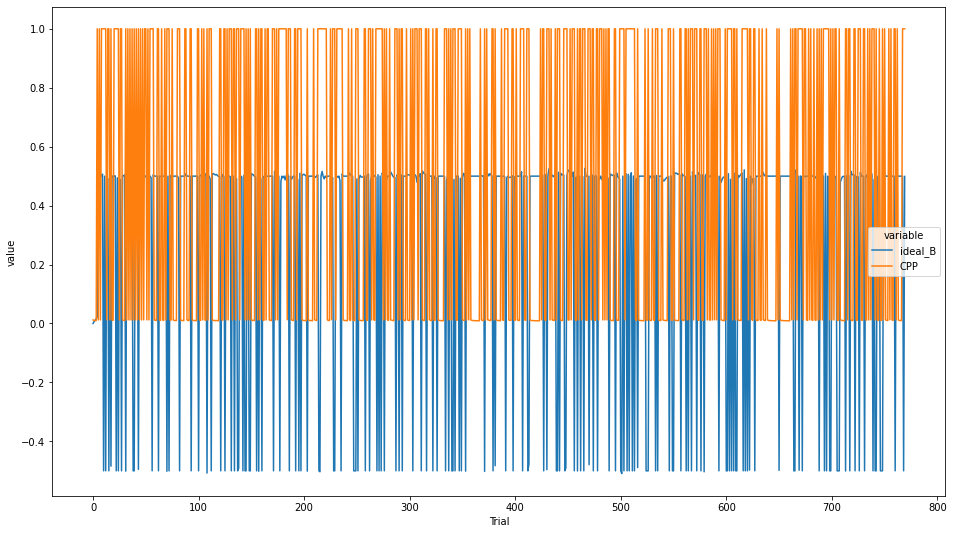

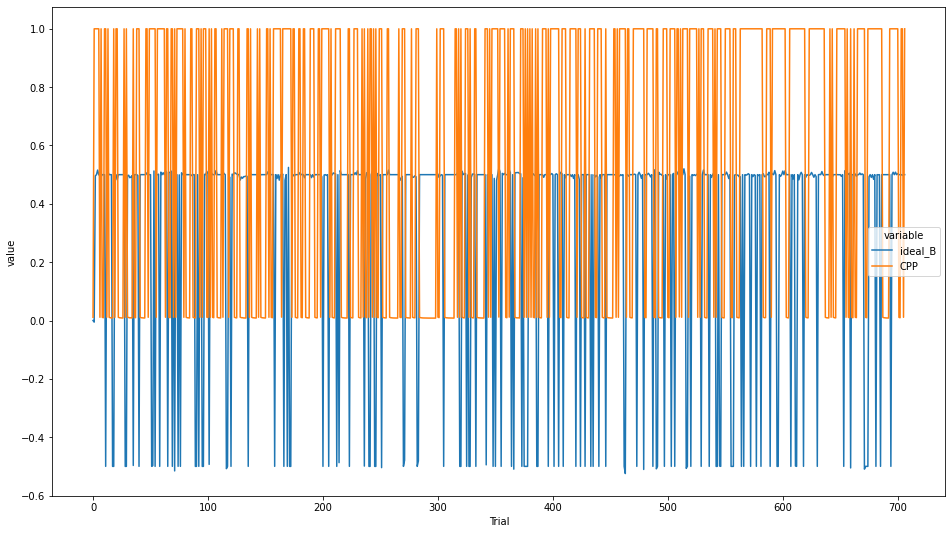

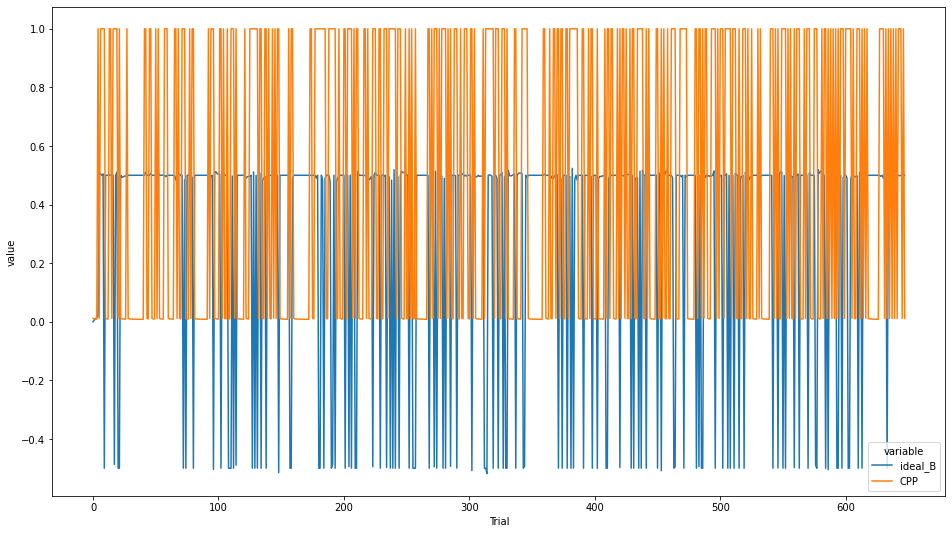

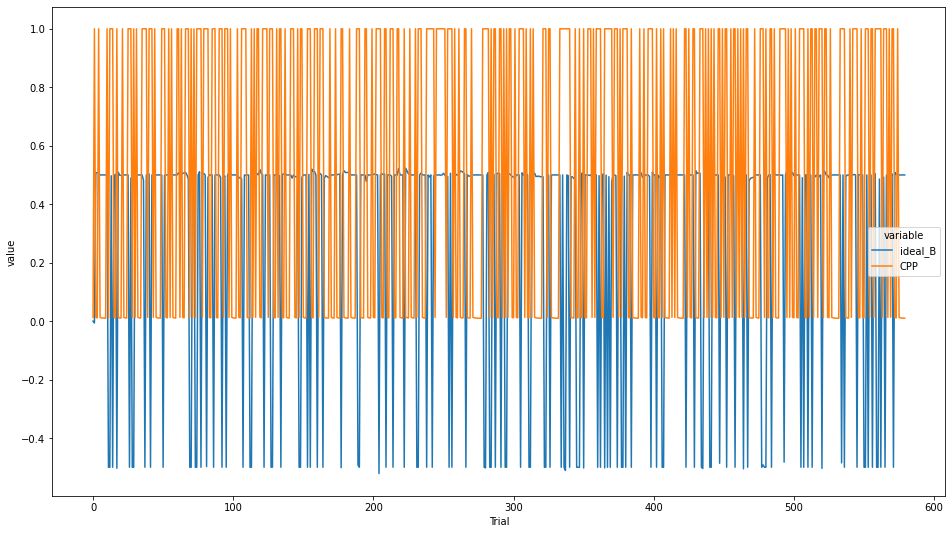

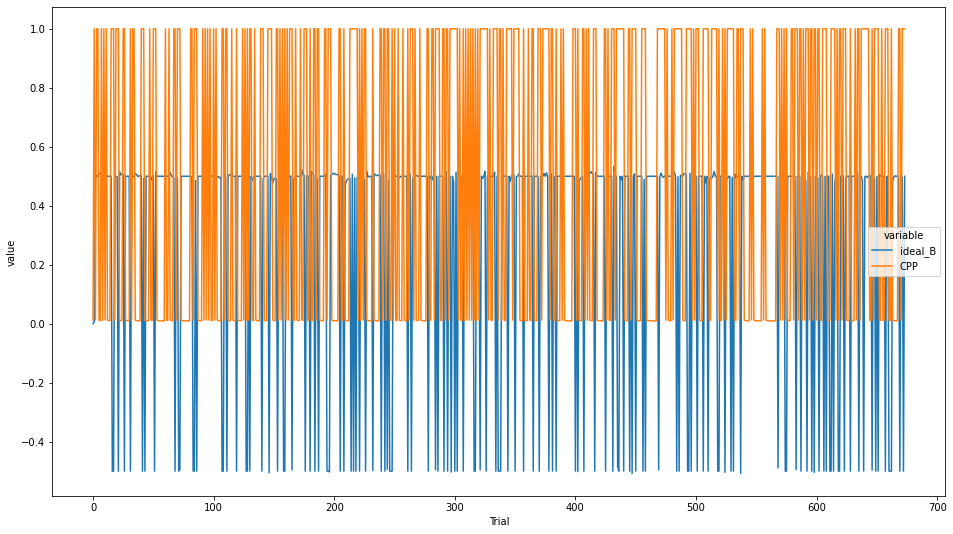

...

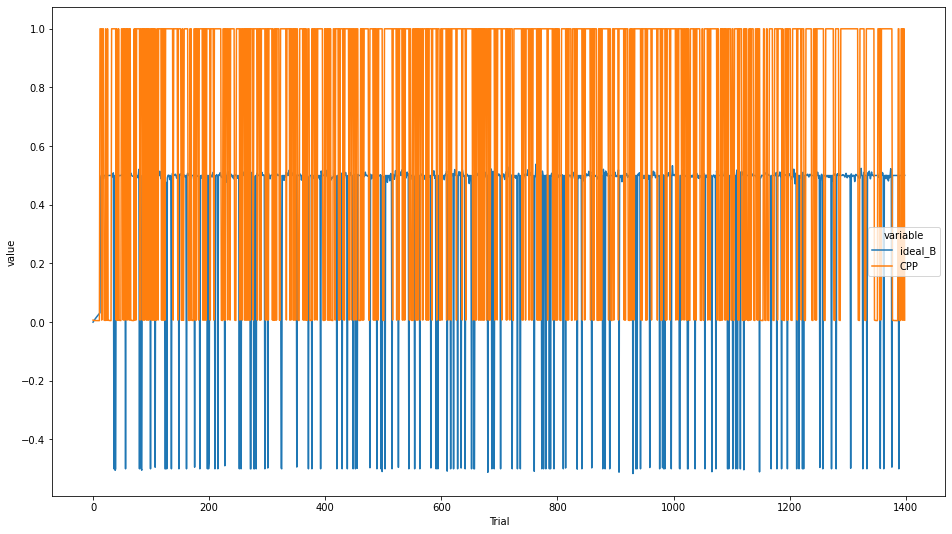

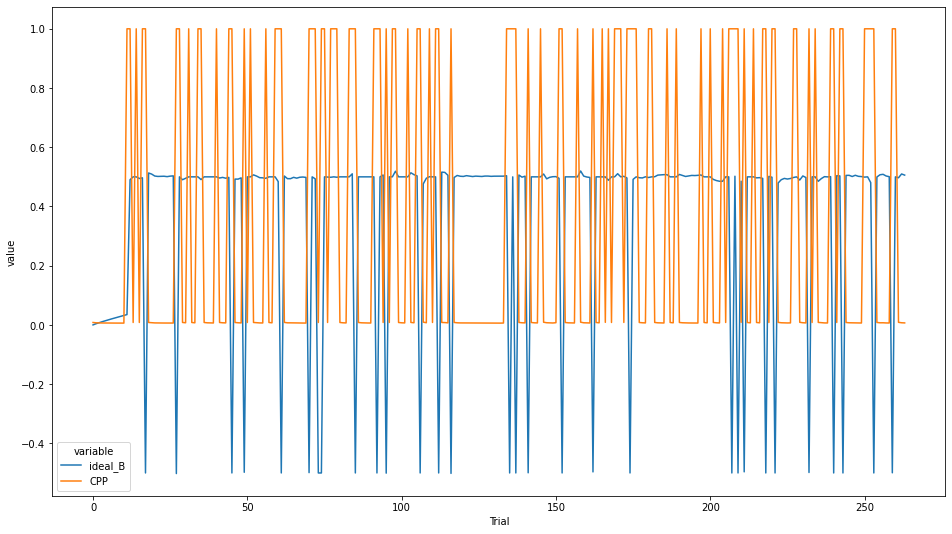

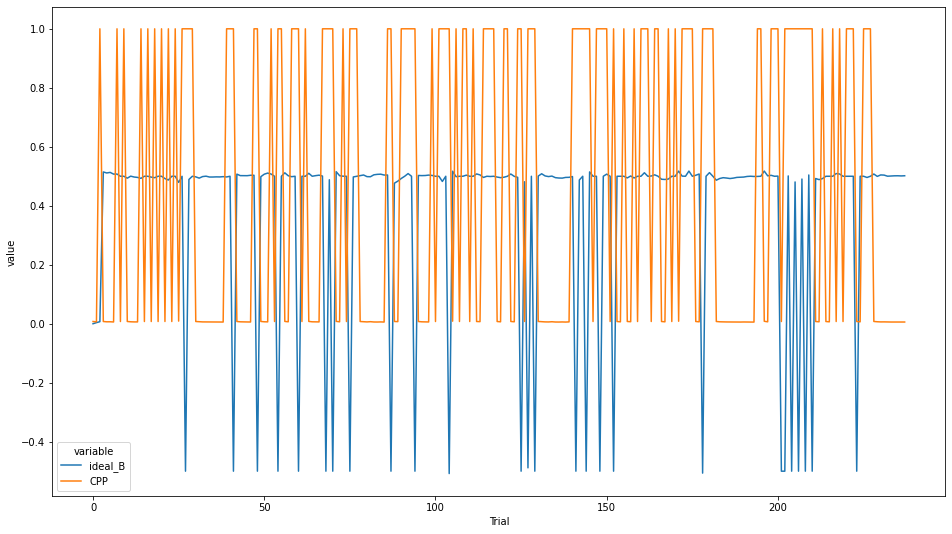

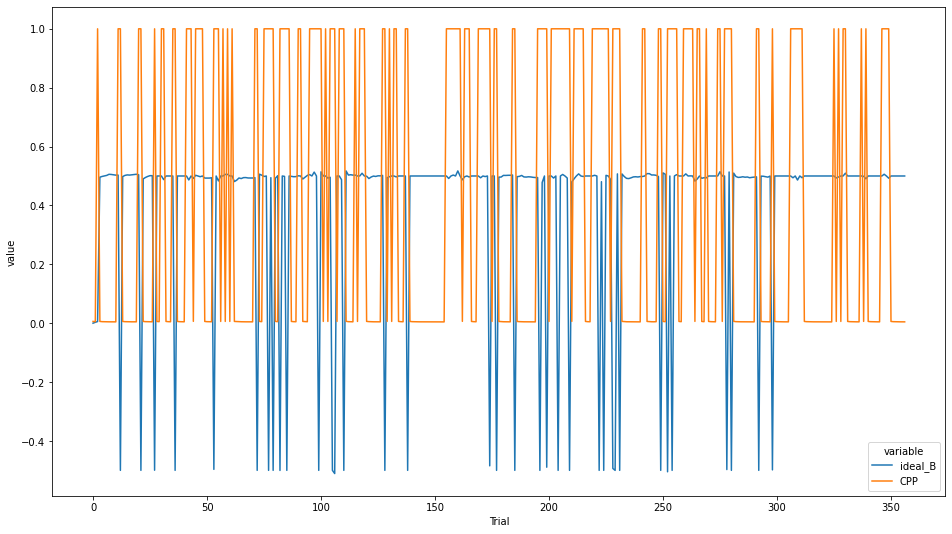

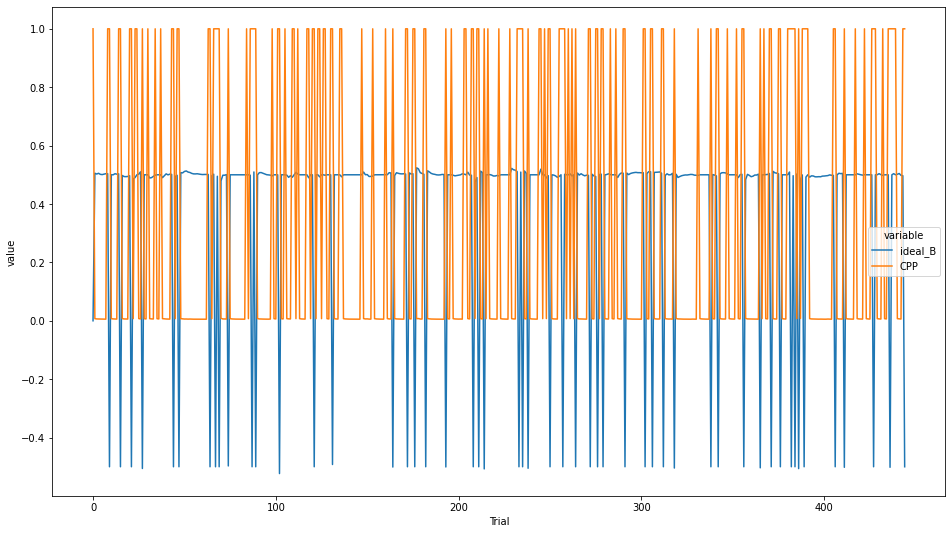

In [7]:
for grp in B_CPP_df.groupby(["Conflict","Volatility","Condition","Session"]):
    fig,ax = pl.subplots(1,1,figsize=(16,9))
    dat_slice = grp[1][["ideal_B","CPP","Trial"]]
    dat_slice_melt = dat_slice.melt("Trial")
    sns.lineplot(x="Trial",y="value",hue="variable",data=dat_slice_melt,ax=ax)
    fig.savefig(fig_target_dir+"B_CPP_df_"+grp[0][0]+"_"+grp[0][1]+"_"+grp[0][2]+"_"+str(grp[0][3])+".png")

In [8]:
#g1 = sns.catplot(x="Trial",y="CPP",hue='Day',data=B_CPP_df.loc[(B_CPP_df["Condition"]=="Control")& (B_CPP_df["Conflict"]=="No" )],kind='point')

In [9]:
#g2 = sns.catplot(x="Trial",y="B_diff",hue='Day',data=B_CPP_df.loc[(B_CPP_df["Condition"]=="Control")& (B_CPP_df["Conflict"]=="No" )],kind='point')

In [10]:
max_lag = 6 # -1 to 5
cp_aligned_B = pd.DataFrame(columns=["Volatility","Condition","Conflict","Session","B_diff","CPP","time_from_change_point","signed_B_diff","Block","ideal_B","learning_rate","MC","sF","slice_number"])
sn = 0
for grp in B_CPP_df.groupby(["Volatility","Condition","Conflict","Session","Block"]):
    ind_cp = np.where(grp[1]["change_point"]==1.0)[0]
    #print(ind_cp)
    mask_cp = np.logical_and(ind_cp!=0,ind_cp!=len(grp[1])-1)
    ind_cp = ind_cp[mask_cp]
    #print(ind_cp)
    for ic in ind_cp:
        dat_slice = grp[1].iloc[ic-1:ic+max_lag]
        #print(dat_slice)
        for l in np.arange(max_lag):
            if l < len(dat_slice)-1:
                lag_dat = dat_slice.iloc[l]
                cp_aligned_B = cp_aligned_B.append({"Volatility":grp[0][0],"Condition":grp[0][1],"Conflict":grp[0][2],"Session":grp[0][3],"B_diff":lag_dat["B_diff"],"CPP":lag_dat["CPP"],"time_from_change_point":l-1,"signed_B_diff":lag_dat["signed_B_diff"],"Block":grp[0][4],"ideal_B":lag_dat["ideal_B"],"learning_rate":lag_dat["learning_rate"],"MC":lag_dat["MC"],"sF":lag_dat["sF"],"slice_number":sn },ignore_index=True)
                
            else:
                continue
        sn+=1

cp_aligned_B.to_csv(data_target_dir+"Change_point_aligned_B_CPP_notebook.csv")

In [11]:
cp_aligned_B["Conflict + Volatility"] = cp_aligned_B["Conflict"] +" - "+cp_aligned_B["Volatility"]
cp_aligned_B["Conflict + Block"] = cp_aligned_B["Conflict"] +" - "+cp_aligned_B["Block"] 
cp_aligned_B["Volatility + Block"] = cp_aligned_B["Volatility"] +" - "+cp_aligned_B["Block"] 
cp_aligned_B
day_limit = -1

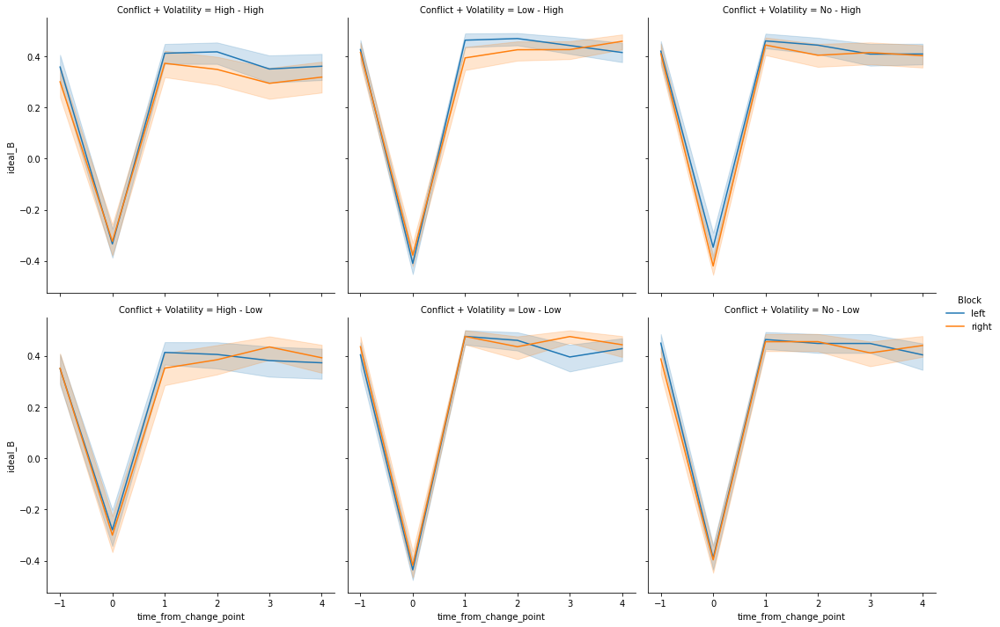

In [12]:
g1 = sns.relplot(x="time_from_change_point",y="ideal_B",data=cp_aligned_B,hue="Block",col="Conflict + Volatility",kind='line',col_wrap=3)


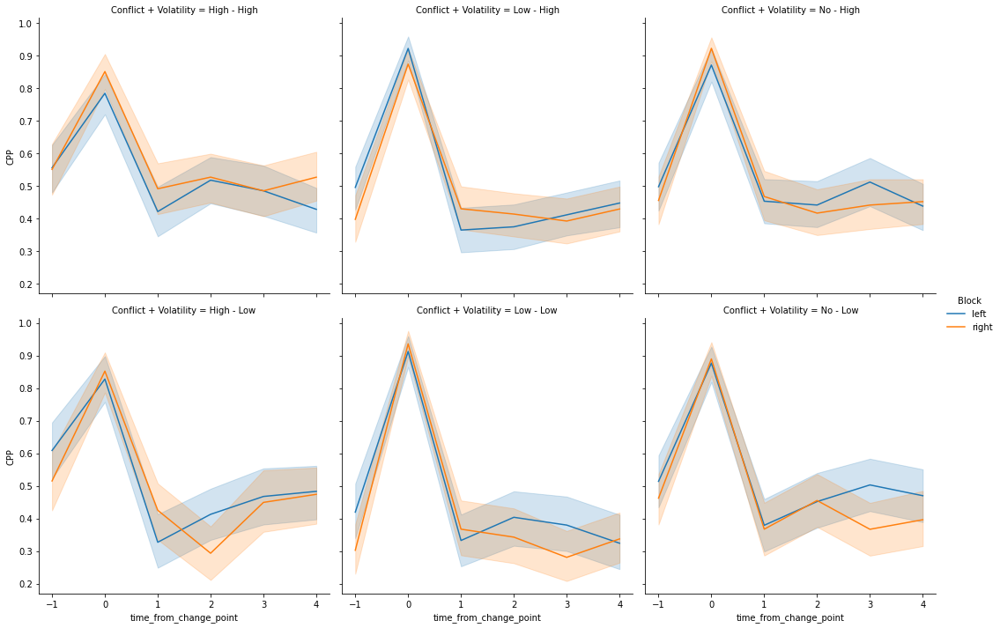

In [13]:
g2 = sns.relplot(x="time_from_change_point",y="CPP",data=cp_aligned_B,hue="Block",col="Conflict + Volatility",kind='line',col_wrap=3)

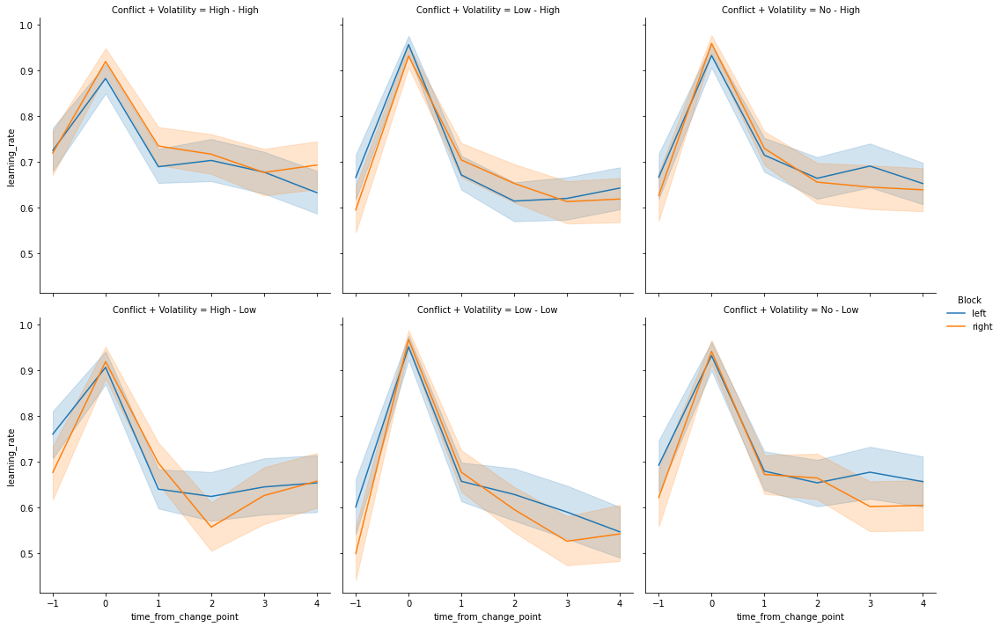

In [14]:
g2 = sns.relplot(x="time_from_change_point",y="learning_rate",data=cp_aligned_B,hue="Block",col="Conflict + Volatility",kind='line',col_wrap=3)

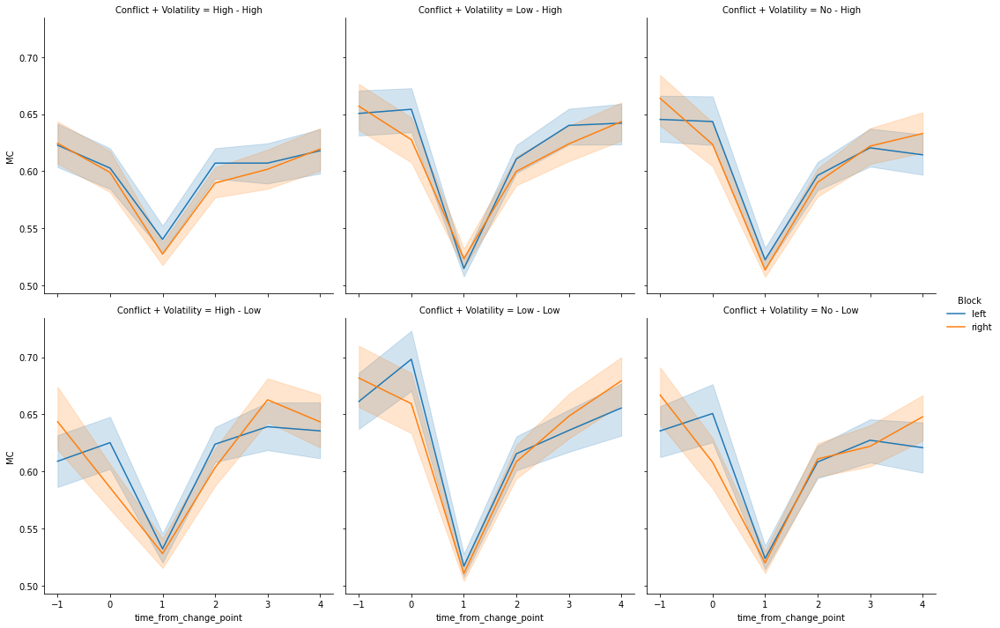

In [15]:
g2 = sns.relplot(x="time_from_change_point",y="MC",data=cp_aligned_B,hue="Block",col="Conflict + Volatility",kind='line',col_wrap=3)

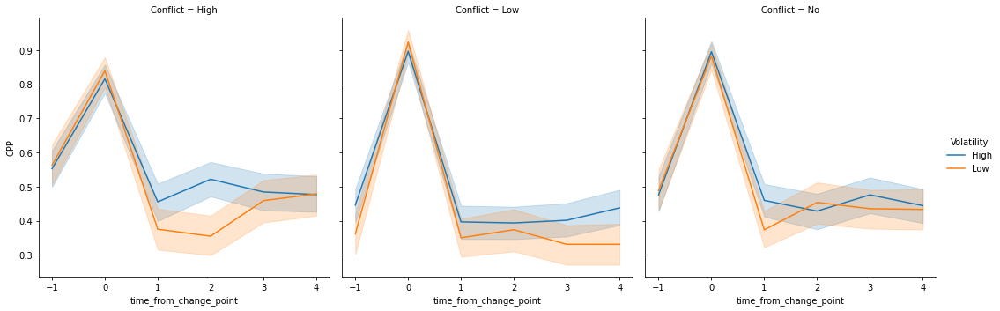

In [16]:
g4 = sns.relplot(x="time_from_change_point",y="CPP",data=cp_aligned_B,hue="Volatility",col="Conflict",kind='line')

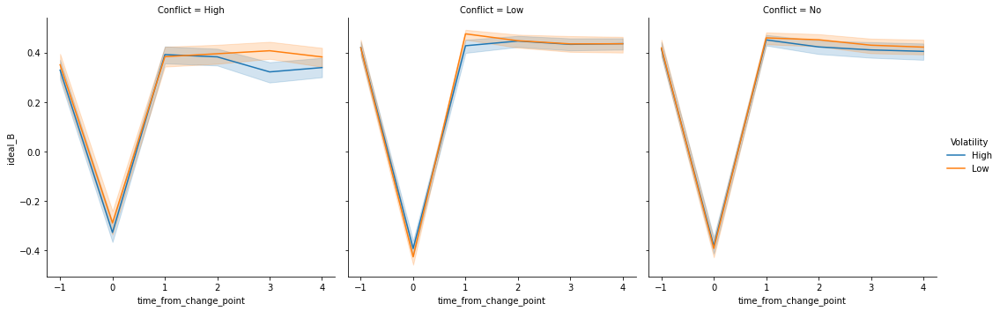

In [17]:
g5 = sns.relplot(x="time_from_change_point",y="ideal_B",data=cp_aligned_B,hue="Volatility",col="Conflict",kind='line',col_wrap=3)

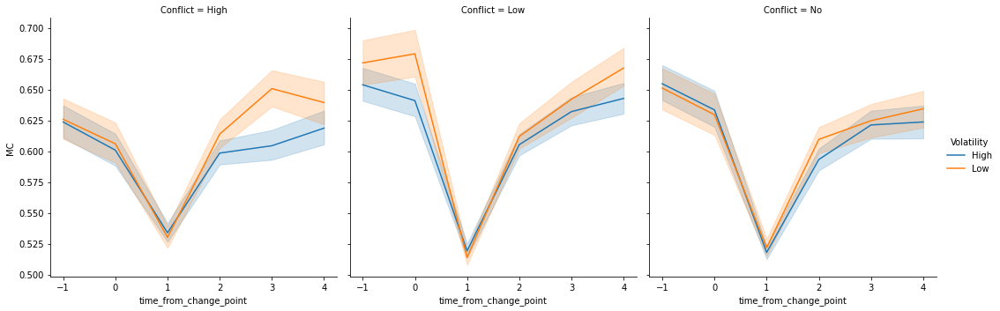

In [18]:
g5 = sns.relplot(x="time_from_change_point",y="MC",data=cp_aligned_B,hue="Volatility",col="Conflict",kind='line',col_wrap=3)

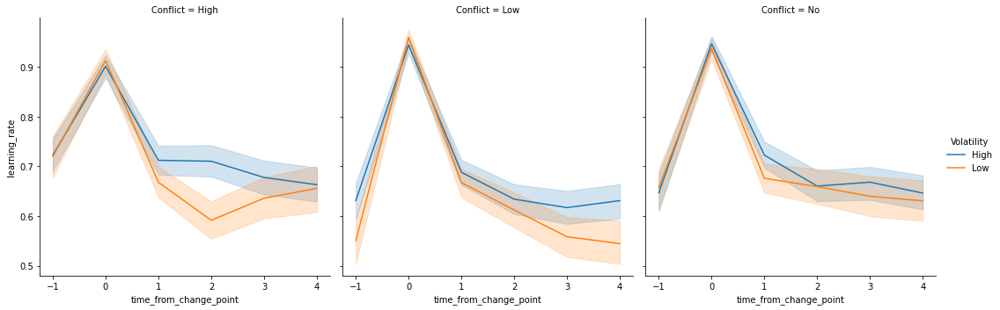

In [19]:
g5 = sns.relplot(x="time_from_change_point",y="learning_rate",data=cp_aligned_B,hue="Volatility",col="Conflict",kind='line',col_wrap=3)

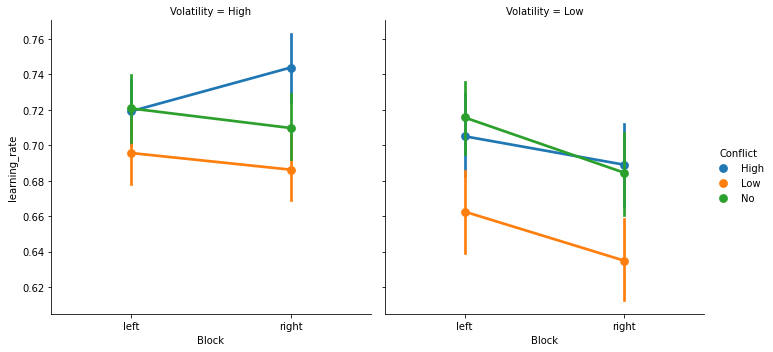

In [20]:
sns.catplot(x="Block",y="learning_rate",hue="Conflict",col="Volatility",kind="point",data=cp_aligned_B)